## Question 1: Evaluate Current Inventory Management Practices  
Analyze how well the gas stations manage their fuel inventory and order quantities.

### Data Preprocessing
o Concatenate Fuel_Level_Part_1.csv and Fuel_Level_Part_2.csv.  
o Merge the Tanks.csv, Locations.csv, and Invoices.csv datasets.  
o Clean datasets and handle missing values

In [1]:
import pandas as pd

# clean dataset Fuel_Level_Part_1
df_Fuel1 = pd.read_csv("Fuel_Level_Part_1.csv")
df_Fuel1_clean = df_Fuel1.dropna()

# clean dataset Fuel_Level_Part_2
df_Fuel2 = pd.read_csv("Fuel_Level_Part_2.csv")
df_Fuel2_clean = df_Fuel2.dropna()

# concat Fuel_Level_Part_1 and Fuel_Level_Part_2, drop duplicates
df_Fuel2_clean.rename(columns={"Fuel_Level": "Fuel Level"}, inplace=True)
df_Fuel2_clean.rename(columns={"Timestamp": "Time stamp"}, inplace=True)
df_combined_Fuel = pd.concat([df_Fuel1_clean, df_Fuel2_clean]).drop_duplicates().reset_index(drop=True)
display(df_combined_Fuel.head())

print('duplicates = ', df_combined_Fuel.duplicated().sum())


,Tank ID,Fuel Level,Time stamp
0,T 12,27161.0,1/1/2017 0:10
1,T 12,27017.0,1/1/2017 0:25
2,T 12,26934.0,1/1/2017 0:40
3,T 12,26786.0,1/1/2017 0:55
4,T 12,26748.0,1/1/2017 1:10


duplicates =  0


In [2]:
# clean dataset Invoices
df_Invoices = pd.read_csv("Invoices.csv")
df_Invoices_clean = df_Invoices.dropna()
df_Invoices_clean.head()

,Invoice Date,Invoice ID,Invoice Gas Station Location,Gross Purchase Cost,Amount Purchased,Fuel Type
0,1/2/2017,10000.0,1,7570.82000,6609.600,G
1,1/2/2017,10001.0,1,12491.85300,9338.736,D
3,1/2/2017,10002.0,2,17034.34500,13377.824,D
5,1/2/2017,10003.0,2,12616.77153,9432.112,D
6,1/2/2017,10004.0,4,11363.80082,9139.200,D


In [3]:
df_Tanks = pd.read_csv("Tanks.csv")
df_Tanks['Tank Type'] = df_Tanks['Tank Type'].replace({'U': 'G', 'P': 'G'})
df_Tanks.head()

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity
0,T 10,1,1,G,40000
1,T 11,1,2,G,40000
2,T 12,1,3,D,40000
3,T 13,1,4,G,40000
4,T 14,1,5,G,40000


In [4]:
df_Locations = pd.read_csv("Locations.csv")
df_Locations.head()

,Gas Station Location,Gas Station Name,Gas Station Address,Gas Station Latitude,Gas Station Longitude
0,1,EastMount,"386 Upper Gage Ave, Hamilton, ON L8V 4H9, Canada",43.234670,-79.836510
1,2,Eastgate,"75 Centennial Pkwy N E5, Hamilton, ON L8E 2P2,...",43.230700,-79.763930
2,3,Central,"80 Park St N, Hamilton, ON L8R 2M9, Canada",43.260260,-79.870580
3,4,Chedoke,"16 McMaster Ave, Dundas, ON L9H 0A8, Canada",43.261849,-79.937057
4,5,Mountain View,"985 Scenic Dr, Hamilton, ON L9C 1H7, Canada",43.244910,-79.921850


In [5]:
# merge Invoices and Locations
df_Invoices_Locations = df_Invoices_clean.merge(df_Locations, left_on="Invoice Gas Station Location", right_on="Gas Station Location", how="outer").drop(columns="Gas Station Location").drop_duplicates()
df_Invoices_Locations['Invoice Date'] = pd.to_datetime(df_Invoices_Locations['Invoice Date'])
df_Invoices_Locations['Invoice Day Name'] = df_Invoices_Locations['Invoice Date'].dt.day_name()
df_Invoices_Locations = df_Invoices_Locations[df_Invoices_Locations['Invoice Day Name'] != "Saturday"]     # remove weekends
display(df_Invoices_Locations.sample(5))

# check integrality
print("null value:", df_Invoices_Locations.isnull().sum().sum())


,Invoice Date,Invoice ID,Invoice Gas Station Location,Gross Purchase Cost,Amount Purchased,Fuel Type,Gas Station Name,Gas Station Address,Gas Station Latitude,Gas Station Longitude,Invoice Day Name
789,2018-06-29,11664.0,1,9463.52500,9322.000,G,EastMount,"386 Upper Gage Ave, Hamilton, ON L8V 4H9, Canada",43.23467,-79.83651,Friday
1893,2019-01-02,12223.0,2,13248.93500,11956.560,D,Eastgate,"75 Centennial Pkwy N E5, Hamilton, ON L8E 2P2,...",43.23070,-79.76393,Wednesday
938,2018-10-17,11991.0,1,9842.06600,9694.880,G,EastMount,"386 Upper Gage Ave, Hamilton, ON L8V 4H9, Canada",43.23467,-79.83651,Wednesday
1042,2018-12-31,12212.0,1,9081.19859,8299.392,D,EastMount,"386 Upper Gage Ave, Hamilton, ON L8V 4H9, Canada",43.23467,-79.83651,Monday
1208,2019-05-08,12581.0,1,11344.87377,4239.920,D,EastMount,"386 Upper Gage Ave, Hamilton, ON L8V 4H9, Canada",43.23467,-79.83651,Wednesday


null value: 0


In [6]:
# merge Invoices, Tanks, Locations
df_combined = df_Invoices_Locations.merge(df_Tanks, left_on="Invoice Gas Station Location", right_on="Tank Location", how="outer")
df_combined.drop(columns="Tank Location", inplace=True)
df_combined = df_combined.drop_duplicates()
display(df_combined.head())

# check integrality
print("null value:", df_combined.isnull().sum().sum())


,Invoice Date,Invoice ID,Invoice Gas Station Location,Gross Purchase Cost,Amount Purchased,Fuel Type,Gas Station Name,Gas Station Address,Gas Station Latitude,Gas Station Longitude,Invoice Day Name,Tank ID,Tank Number,Tank Type,Tank Capacity
0,2017-01-02,10000.0,1,7570.82,6609.6,G,EastMount,"386 Upper Gage Ave, Hamilton, ON L8V 4H9, Canada",43.23467,-79.83651,Monday,T 10,1,G,40000
1,2017-01-02,10000.0,1,7570.82,6609.6,G,EastMount,"386 Upper Gage Ave, Hamilton, ON L8V 4H9, Canada",43.23467,-79.83651,Monday,T 11,2,G,40000
2,2017-01-02,10000.0,1,7570.82,6609.6,G,EastMount,"386 Upper Gage Ave, Hamilton, ON L8V 4H9, Canada",43.23467,-79.83651,Monday,T 12,3,D,40000
3,2017-01-02,10000.0,1,7570.82,6609.6,G,EastMount,"386 Upper Gage Ave, Hamilton, ON L8V 4H9, Canada",43.23467,-79.83651,Monday,T 13,4,G,40000
4,2017-01-02,10000.0,1,7570.82,6609.6,G,EastMount,"386 Upper Gage Ave, Hamilton, ON L8V 4H9, Canada",43.23467,-79.83651,Monday,T 14,5,G,40000


null value: 0


### Visualize Fuel Levels 
Create visualizations for each tank to assess inventory trends over time.  
Identify stations with effective inventory management practices and those at risk of stockouts.

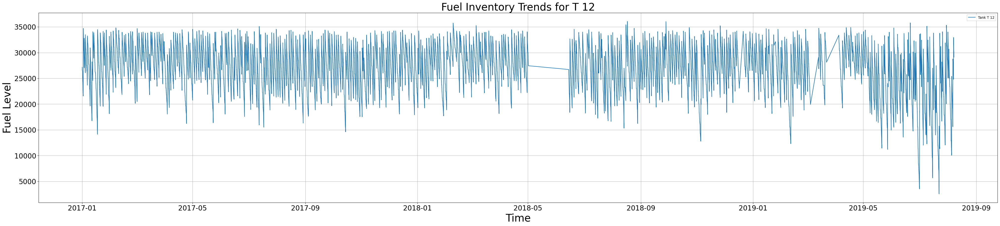

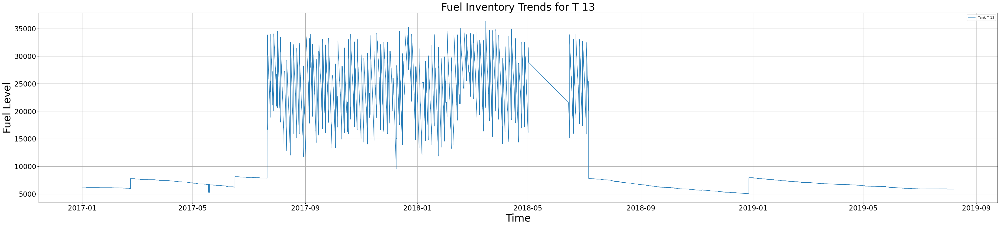

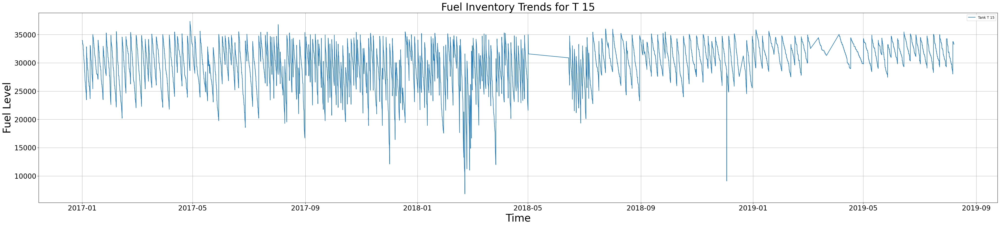

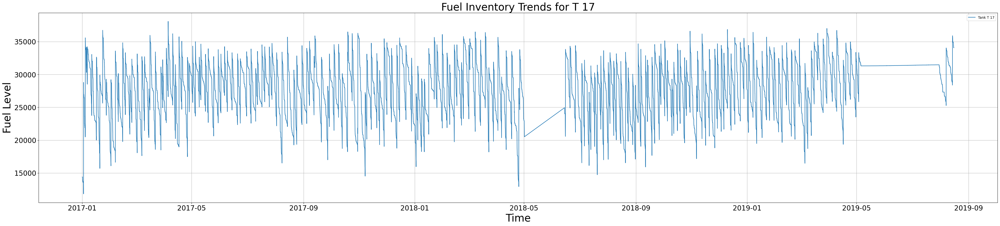

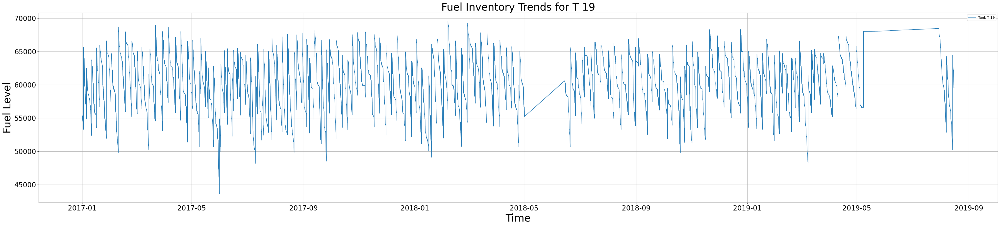

...

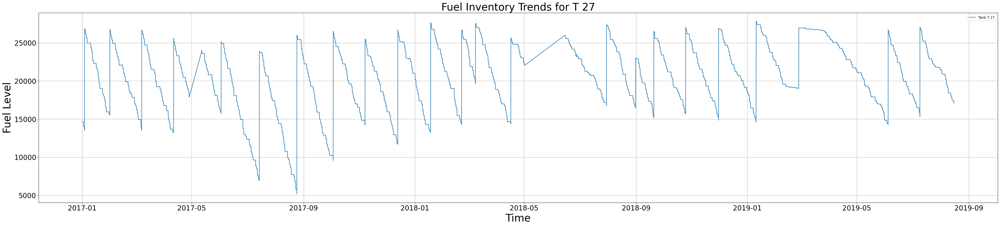

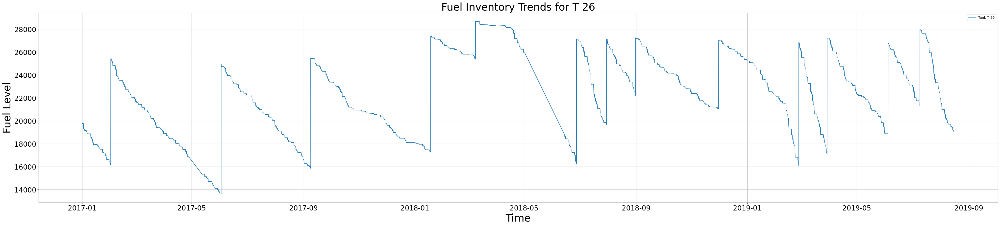

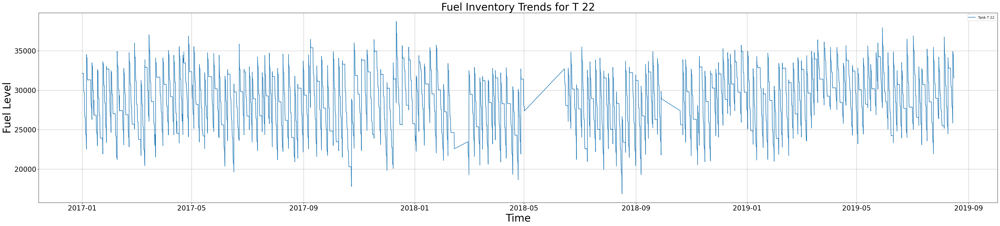

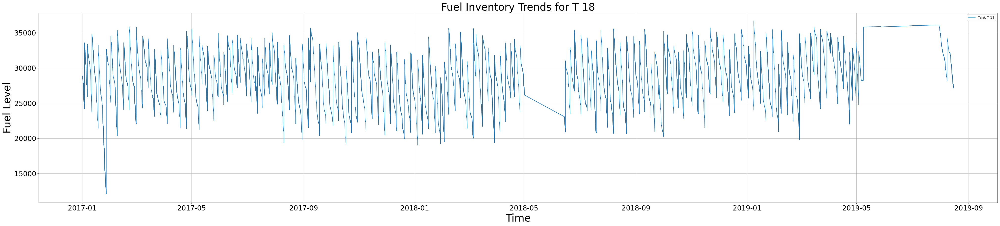

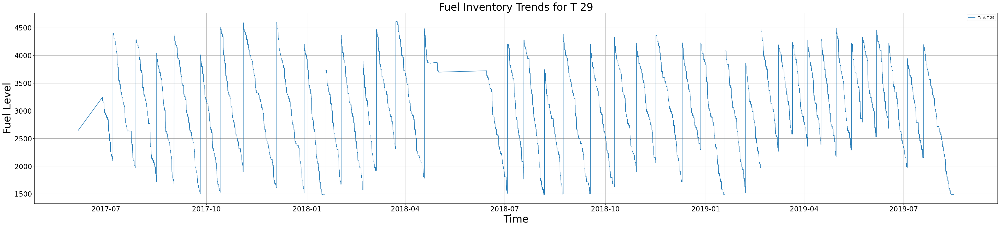

In [7]:
### Visualizations for each tank

import pandas as pd
import matplotlib.pyplot as plt

# Ensure 'Time stamp' is in datetime format
df_combined_Fuel['Time stamp'] = pd.to_datetime(df_combined_Fuel['Time stamp'])

# Get unique tanks
unique_tanks = df_combined_Fuel['Tank ID'].unique()

# Plot trends for each tank
for tank in unique_tanks:
    tank_data = df_combined_Fuel[df_combined_Fuel['Tank ID'] == tank]
    
    plt.figure(figsize=(50, 10))
    plt.plot(tank_data['Time stamp'], tank_data['Fuel Level'], label=f'Tank {tank}')
    plt.title(f"Fuel Inventory Trends for {tank}", fontsize=30)
    plt.xlabel("Time", fontsize=30)
    plt.ylabel("Fuel Level", fontsize=30)
    plt.tick_params(axis='x', labelsize=20)
    plt.tick_params(axis='y', labelsize=20)
    plt.legend()
    plt.grid(True)
    plt.show()


In [8]:
### Identity different stations

# Merge Fuel, Tanks, Locations to get connection between Fuel_Level and Gas_Station
df_Stations = df_combined_Fuel.merge(df_Tanks, on="Tank ID", how="outer").merge(df_Locations, left_on="Tank Location", right_on="Gas Station Location", how="outer")

# Calculate statistics for each station
summary_stats = df_Stations.groupby('Gas Station Name')['Fuel Level'].agg(['min', 'max', 'mean']).reset_index()

# Extract capacity
capacity = {}
unique_stations = df_Locations['Gas Station Name'].unique()
for station in unique_stations:
    capacity[station] = df_Stations[df_Stations['Gas Station Name'] == station]['Tank Capacity'].iloc[0]

# Add capacity column based on Gas Station Name
summary_stats['Capacity'] = summary_stats['Gas Station Name'].map(capacity)

# Set up thresholds manually
summary_stats['Low Threshold'] = 0.1 * summary_stats['Capacity']
summary_stats['High Threshold'] = 0.9 * summary_stats['Capacity']

# Add flags for risky and effective categories
summary_stats['At Risk of Stockout'] = summary_stats['min'] < summary_stats['Low Threshold']
summary_stats['Effective Inventory'] = (summary_stats['mean'] > summary_stats['Low Threshold']) & (summary_stats['max'] < summary_stats['High Threshold'])
display(summary_stats)

# Output station names
at_risk_tanks = summary_stats[summary_stats['At Risk of Stockout'] == True]['Gas Station Name']
print("at_risk_tanks: ", list(at_risk_tanks))

effective_tanks = summary_stats[summary_stats['Effective Inventory'] == True]['Gas Station Name']
print("effective_tanks: ", list(effective_tanks))

effective_and_not_at_risk = summary_stats[(summary_stats['At Risk of Stockout'] == False) & (summary_stats['Effective Inventory'] == True)]['Gas Station Name']
print("effective_and_not_at_risk: ", list(effective_and_not_at_risk))


,Gas Station Name,min,max,mean,Capacity,Low Threshold,High Threshold,At Risk of Stockout,Effective Inventory
0,Central,8548.0,29228.0,20278.414087,30000,3000.0,27000.0,False,False
1,Chappel,5811.0,35875.0,26058.084466,40000,4000.0,36000.0,False,True
2,Chedoke,14169.0,38718.0,28384.862286,40000,4000.0,36000.0,False,False
3,Circle,1484.0,4613.0,3278.552814,5000,500.0,4500.0,False,False
4,EastMount,2567.0,37824.0,23781.079247,40000,4000.0,36000.0,True,False
5,Eastgate,11822.0,69531.0,44440.646973,70000,7000.0,63000.0,False,False
6,Mountain View,4736.0,23058.0,16280.392495,25000,2500.0,22500.0,False,False
7,Oakville,5194.0,28785.0,21800.948298,30000,3000.0,27000.0,False,False


at_risk_tanks:  ['EastMount']
effective_tanks:  ['Chappel']
effective_and_not_at_risk:  ['Chappel']


By setting that `low_threshold = 0.1*capacity` and `high_threshold = 0.9*capacity`, it deduced that `EastMount` is at risk of stockouts and `Chappel` is effective inventory.

### Quantify Current Performance 
Analyze the Invoices.csv dataset to evaluate current purchasing patterns.  
Calculate cost savings achieved via discounts for stations 1–8.

In [9]:
df_Invoices_clean.head()

,Invoice Date,Invoice ID,Invoice Gas Station Location,Gross Purchase Cost,Amount Purchased,Fuel Type
0,1/2/2017,10000.0,1,7570.82000,6609.600,G
1,1/2/2017,10001.0,1,12491.85300,9338.736,D
3,1/2/2017,10002.0,2,17034.34500,13377.824,D
5,1/2/2017,10003.0,2,12616.77153,9432.112,D
6,1/2/2017,10004.0,4,11363.80082,9139.200,D


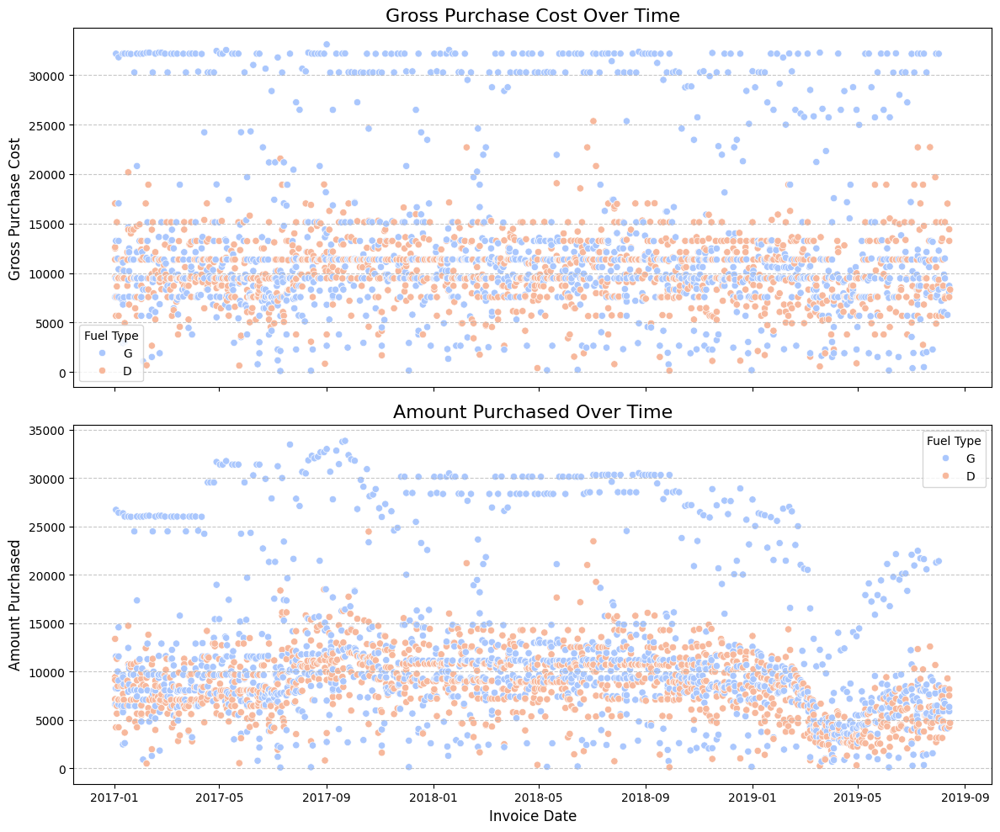

In [10]:
### Evaluate purchasing patterns by visualization

import matplotlib.pyplot as plt
import seaborn as sns

df_Invoices_clean.loc[:, 'Invoice Date'] = pd.to_datetime(df_Invoices_clean['Invoice Date'], errors='coerce')

fig, ax = plt.subplots(2, 1, figsize=(12, 10), sharex=True)

# First plot: Gross Purchase Cost over time
sns.scatterplot(
    data=df_Invoices_clean,
    x='Invoice Date',
    y='Gross Purchase Cost',
    hue='Fuel Type',
    palette='coolwarm',
    ax=ax[0]
)
ax[0].set_title('Gross Purchase Cost Over Time', fontsize=16)
ax[0].set_xlabel('')
ax[0].set_ylabel('Gross Purchase Cost', fontsize=12)
ax[0].legend(title='Fuel Type', fontsize=10)
ax[0].grid(axis='y', linestyle='--', alpha=0.7)

# Second plot: Amount Purchased over time
sns.scatterplot(
    data=df_Invoices_clean,
    x='Invoice Date',
    y='Amount Purchased',
    hue='Fuel Type',
    palette='coolwarm',
    ax=ax[1]
)
ax[1].set_title('Amount Purchased Over Time', fontsize=16)
ax[1].set_xlabel('Invoice Date', fontsize=12)
ax[1].set_ylabel('Amount Purchased', fontsize=12)
ax[1].legend(title='Fuel Type', fontsize=10)
ax[1].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


In [11]:
### Calculate discount

df_Invoices_discount = df_Invoices_clean.copy()

total_gross_cost = df_Invoices_discount['Gross Purchase Cost'].sum()
total_amount_purchased = df_Invoices_discount['Amount Purchased'].sum()

# Calculate the average discount percentage and the total cost savings
df_Invoices_discount.loc[:, 'Discount'] = 1 - (df_Invoices_discount['Amount Purchased'] / df_Invoices_discount['Gross Purchase Cost'])
average_discount = df_Invoices_discount['Discount'].mean() * 100
cost_savings = total_gross_cost - df_Invoices_discount['Amount Purchased'].sum()

df_Invoices_analysis = df_Invoices_discount.groupby('Invoice Gas Station Location')[['Gross Purchase Cost', 'Amount Purchased', 'Discount']].mean()

print(f'Total Gross Purchase Cost for all Stations: ${total_gross_cost:,.2f}')
print(f'Total Amount Purchased for all Stations: ${total_amount_purchased:,.2f}')
print(f'Overall Average Discount Percentage: {average_discount:.2f}%')
print(f'Total Cost Savings: ${cost_savings:,.2f}\n')
print('Invoices Dataframe Table groups by Invoice Gas Station Location with Discount:\n')
display(df_Invoices_analysis)


Total Gross Purchase Cost for all Stations: $33,298,726.25
Total Amount Purchased for all Stations: $29,076,698.06
Overall Average Discount Percentage: 13.12%
Total Cost Savings: $4,222,028.19

Invoices Dataframe Table groups by Invoice Gas Station Location with Discount:



,Gross Purchase Cost,Amount Purchased,Discount
Invoice Gas Station Location,,,
1,13371.750833,11564.047941,0.138964
2,11163.844922,9942.110101,0.114982
3,11753.840003,10691.672200,0.091862
4,10388.579252,9019.905079,0.136090
5,8865.605971,7708.738457,0.137082
6,11566.049869,10507.382095,0.106152
7,2256.832323,2012.405538,0.133039
8,11431.532620,10135.476571,0.144251


The above dataframe shows the discount of all 8 stations.  
`1`: 0.138964
`2`: 0.114982
`3`: 0.091862
`4`: 0.136090
`5`: 0.137082
`6`: 0.106152
`7`: 0.133039
`8`: 0.144251

## Question 2: Recommend Improved Ordering Strategies 
Propose strategies to improve fuel order quantities and save costs. 

### Quantify Maximum Potential Savings: 
o Use the total tank capacity for each location and fuel type to determine the highest applicable discount rate.  
o Calculate a 7-day inventory threshold based on the average daily consumption for each location and fuel type.  
o Compute potential savings by optimizing order quantities to maximize discounts while maintaining sufficient inventory.

In [12]:
df_Tanks.head()

,Tank ID,Tank Location,Tank Number,Tank Type,Tank Capacity
0,T 10,1,1,G,40000
1,T 11,1,2,G,40000
2,T 12,1,3,D,40000
3,T 13,1,4,G,40000
4,T 14,1,5,G,40000


In [13]:
df_Tanks.groupby(["Tank Location","Tank Type"])['Tank Capacity'].value_counts()

Tank Location  Tank Type  Tank Capacity
1              D          40000            2
               G          40000            4
2              D          40000            1
                          70000            1
               G          40000            1
                          70000            1
3              D          30000            1
               G          30000            1
4              D          40000            1
               G          40000            1
5              D          25000            1
               G          25000            1
6              D          30000            1
               G          30000            2
7              D          5000             1
               G          5000             1
8              D          40000            1
               G          40000            1
Name: count, dtype: int64

In [14]:
total_capacity =df_Tanks.groupby(["Tank Location","Tank Type"])['Tank Capacity'].sum().reset_index()
total_capacity.columns = ['Gas Station Location', 'Fuel Type', 'Total Tank Capacity']
total_capacity

,Gas Station Location,Fuel Type,Total Tank Capacity
0,1,D,80000
1,1,G,160000
2,2,D,110000
3,2,G,110000
4,3,D,30000
5,3,G,30000
6,4,D,40000
7,4,G,40000
8,5,D,25000
9,5,G,25000


In [15]:
discount_tiers = [
    {"range": (0, 15000), "discount": 0}, 
    {"range": (15000, 25000), "discount": 0.02}, 
    {"range": (25000, 40000), "discount": 0.03},  
    {"range": (40000, float('inf')), "discount": 0.04}  
]

In [16]:
def get_discount(tank_capacity):
    for tier in discount_tiers:
        lower, upper = tier["range"]
        if lower < tank_capacity <= upper:
            return tier["discount"]
    return 0 

total_capacity["Max Discount"] = total_capacity["Total Tank Capacity"].apply(get_discount)
total_capacity


,Gas Station Location,Fuel Type,Total Tank Capacity,Max Discount
0,1,D,80000,0.04
1,1,G,160000,0.04
2,2,D,110000,0.04
3,2,G,110000,0.04
4,3,D,30000,0.03
5,3,G,30000,0.03
6,4,D,40000,0.03
7,4,G,40000,0.03
8,5,D,25000,0.02
9,5,G,25000,0.02


The highest applicable discount rate for each location and fuel type is shown above.

In [17]:
df_combined_Fuel.head()

,Tank ID,Fuel Level,Time stamp
0,T 12,27161.0,2017-01-01 00:10:00
1,T 12,27017.0,2017-01-01 00:25:00
2,T 12,26934.0,2017-01-01 00:40:00
3,T 12,26786.0,2017-01-01 00:55:00
4,T 12,26748.0,2017-01-01 01:10:00


In [18]:
df_combined_Fuel['Time stamp'] = pd.to_datetime(df_combined_Fuel['Time stamp'])

df_daily = df_combined_Fuel.groupby(['Tank ID', df_combined_Fuel['Time stamp'].dt.date])['Fuel Level'].last().reset_index()
df_daily.rename(columns={'Time stamp': 'Date'}, inplace=True)


df_daily['Daily Consumption'] = df_daily.groupby('Tank ID')['Fuel Level'].diff().abs()

df_daily = df_daily.merge(df_Tanks[['Tank ID', 'Tank Location', 'Tank Type']], on='Tank ID', how='left')
average_daily_consumption = df_daily.groupby(['Tank Location', 'Tank Type'])['Daily Consumption'].mean().reset_index()

average_daily_consumption.rename(
    columns={'Tank Location': 'Gas Station Location', 'Tank Type': 'Fuel Type', 'Daily Consumption': 'Average Daily Consumption'},
    inplace=True
)
average_daily_consumption


,Gas Station Location,Fuel Type,Average Daily Consumption
0,1,D,3991.685017
1,1,G,3993.879648
2,2,D,3021.766156
3,2,G,2543.053122
4,3,D,883.930265
5,3,G,1000.251046
6,4,D,3049.260227
7,4,G,2780.445455
8,5,D,1708.725877
9,5,G,2377.145833


In [19]:
average_daily_consumption['Seven Day Threshold'] = average_daily_consumption['Average Daily Consumption'] * 7
average_daily_consumption

,Gas Station Location,Fuel Type,Average Daily Consumption,Seven Day Threshold
0,1,D,3991.685017,27941.795119
1,1,G,3993.879648,27957.157536
2,2,D,3021.766156,21152.363089
3,2,G,2543.053122,17801.371851
4,3,D,883.930265,6187.511855
5,3,G,1000.251046,7001.757322
6,4,D,3049.260227,21344.821591
7,4,G,2780.445455,19463.118182
8,5,D,1708.725877,11961.081140
9,5,G,2377.145833,16640.020833


**Based on the 7-Day Threshold values, the procurement strategy can be optimized as follows:**

Firstly, ensure that the purchase quantity meets at least seven days of demand to avoid stockouts. Additionally, adjust the purchase quantity to align with the discount threshold boundaries (e.g., 15,000 liters or 25,000 liters) to maximize cost savings through supplier discounts. 

For high-consumption locations, more frequent purchases may be necessary to prevent inventory shortages. Conversely, for low-consumption locations (e.g., Gas Station 7’s diesel demand), the purchase frequency can be reduced, ensuring that each procurement satisfies multiple weeks of demand while avoiding excessive inventory buildup.

Strategically, high-consumption locations should maintain inventory levels above the 7-Day Threshold at all times to prevent disruptions and adjust purchase quantities to align closely with discount brackets to maximize savings. For low-consumption locations, procurement frequency can be minimized to optimize logistics costs while meeting longer-term inventory needs.

Finally, inventory levels should be dynamically adjusted based on seasonal or situational consumption variations (e.g., differing demand in summer versus winter), ensuring that the 7-Day Threshold values are continually optimized to enhance inventory management and procurement efficiency.

In [20]:
df_combined_Fuel.head()

,Tank ID,Fuel Level,Time stamp
0,T 12,27161.0,2017-01-01 00:10:00
1,T 12,27017.0,2017-01-01 00:25:00
2,T 12,26934.0,2017-01-01 00:40:00
3,T 12,26786.0,2017-01-01 00:55:00
4,T 12,26748.0,2017-01-01 01:10:00


In [21]:
current_inventory_data = df_combined_Fuel.sort_values(by=["Tank ID", "Time stamp"]).groupby("Tank ID").last().reset_index()

current_inventory_data = current_inventory_data[["Tank ID", "Fuel Level"]]
current_inventory_data.rename(columns={"Fuel Level": "Current Inventory"}, inplace=True)

current_inventory_data.head()


,Tank ID,Current Inventory
0,T 10,25056.0
1,T 11,25003.0
2,T 12,29126.0
3,T 13,5879.0
4,T 14,32241.0


In [22]:
current_inventory_data = current_inventory_data.merge(
    df_Tanks[["Tank ID", "Tank Location", "Tank Type"]],
    on="Tank ID",
    how="left"
)

current_inventory_data.head()

,Tank ID,Current Inventory,Tank Location,Tank Type
0,T 10,25056.0,1,G
1,T 11,25003.0,1,G
2,T 12,29126.0,1,D
3,T 13,5879.0,1,G
4,T 14,32241.0,1,G


In [23]:
current_inventory_data.rename(
    columns={"Tank Location": "Gas Station Location", "Tank Type": "Fuel Type"},
    inplace=True
)

current_inventory_data = current_inventory_data.groupby(
    ["Gas Station Location", "Fuel Type"]
)["Current Inventory"].sum().reset_index()

current_inventory_data

,Gas Station Location,Fuel Type,Current Inventory
0,1,D,62416.0
1,1,G,88179.0
2,2,D,93611.0
3,2,G,80573.0
4,3,D,12402.0
5,3,G,20169.0
6,4,D,32669.0
7,4,G,31548.0
8,5,D,16055.0
9,5,G,11815.0


In [24]:
import pandas as pd

discount_rules = [
    (0, 0.00),        
    (15000, 0.02),    
    (25000, 0.03),    
    (40000, 0.04)     
]
optimized_orders = []


for index, row in average_daily_consumption.iterrows():
    location = row["Gas Station Location"]
    fuel_type = row["Fuel Type"]
    threshold = row["Seven Day Threshold"]

    inventory_row = current_inventory_data.loc[
        (current_inventory_data["Gas Station Location"] == location) &
        (current_inventory_data["Fuel Type"] == fuel_type)
    ]
    if inventory_row.empty:
        print(f"Warning: No current inventory data for Location: {location}, Fuel Type: {fuel_type}")
        continue
    current_inventory = inventory_row["Current Inventory"].values[0]

    capacity_row = total_capacity.loc[
        (total_capacity["Gas Station Location"] == location) &
        (total_capacity["Fuel Type"] == fuel_type)
    ]
    if capacity_row.empty:
        print(f"Warning: No capacity data for Location: {location}, Fuel Type: {fuel_type}")
        continue
    capacity = capacity_row["Total Tank Capacity"].values[0]

    needed_inventory = max(0, threshold - current_inventory)
    max_order = capacity - current_inventory
    optimal_order = 0
    max_discount = 0
    for quantity, discount in discount_rules:
        if quantity <= max_order:  
            optimal_order = quantity
            max_discount = discount
        else:
            break
            
    if optimal_order == 0:
        optimal_order = max_order

    original_cost = optimal_order
    discounted_cost = optimal_order * (1 - max_discount)
    savings = original_cost - discounted_cost
    
    optimized_orders.append({
        "Gas Station Location": location,
        "Fuel Type": fuel_type,
        "Optimal Order Quantity": optimal_order,
        "Max Discount": max_discount,
        "Potential Savings": savings
    })

optimized_orders_df = pd.DataFrame(optimized_orders)
optimized_orders_df


,Gas Station Location,Fuel Type,Optimal Order Quantity,Max Discount,Potential Savings
0,1,D,15000.0,0.02,300.0
1,1,G,40000.0,0.04,1600.0
2,2,D,15000.0,0.02,300.0
3,2,G,25000.0,0.03,750.0
4,3,D,15000.0,0.02,300.0
5,3,G,9831.0,0.00,0.0
6,4,D,7331.0,0.00,0.0
7,4,G,8452.0,0.00,0.0
8,5,D,8945.0,0.00,0.0
9,5,G,13185.0,0.00,0.0


### Provide Recommendations: 
Offer specific recommendations to improve inventory policies and estimate potential cost savings for each location. 

**Recommendations for Improving Inventory Policies**

**Overall Observations**

1. Zero Discount Scenarios
- Some gas stations failed to meet the minimum discount threshold (e.g., 15,000 liters), resulting in no discounts (Max Discount = 0).
- These locations have no potential savings, indicating room to optimize order quantities to improve cost efficiency.

2. Underutilized Discounts
- At certain gas stations, while the order quantities reached the discount threshold of 15,000 liters or higher, they failed to fully utilize the maximum tank capacity.
- For example, at Gas Station Location 3 and Location 6, the order quantities barely met the threshold.

3. Insufficient Order Quantities
- At some locations (e.g., Location 5 and Location 7), the order quantities did not reach the discount threshold, suggesting the need to adjust ordering strategies.


**Specific Recommendations**

1. Optimize Order Distribution
- Objective: Ensure order quantities at each gas station are as close as possible to higher discount thresholds (e.g., 25,000 liters or 40,000 liters), without exceeding tank capacity.
- Strategies:
  - Reassess actual demand and tank capacity to create a centralized purchasing strategy.
  - For locations with insufficient order quantities (e.g., Location 5 and Location 7), consider consolidating demand from other gas stations or reducing delivery frequency to concentrate orders.


2. Increase Discount Utilization
- Objective: Reduce unit costs by meeting higher discount thresholds.
- Specific Actions:
  - For locations where order quantities are near discount thresholds but underutilized (e.g., Location 6), increase orders to 25,000 liters or 40,000 liters, if capacity and demand allow.
  - Prioritize increasing order quantities at high-volume locations (e.g., Location 1 and Location 2), as these stations have higher potential cost savings.


3. Improve Forecasting Models
- Objective: Refine daily consumption and inventory forecasting models to ensure order quantities align with actual demand.
- Specific Actions:
  - Introduce more precise demand forecasting algorithms, such as time series models or machine learning techniques.
  - Continuously monitor the gap between `Current Inventory` and the `Seven Day Threshold` to dynamically adjust order quantities.

4. Enhance Logistics and Storage Policies
- Objective: Reduce storage and transportation costs by optimizing delivery frequencies and tank utilization.
- Specific Actions:
  - For locations with smaller demand (e.g., Location 7 and Location 8), consider adjusting delivery frequencies or sharing delivery resources.
  - Regularly review tank capacity utilization to ensure efficient resource usage and avoid underutilization.

By implementing these recommendations, gas stations can achieve improved inventory policies, better utilize available discounts, and realize significant cost savings. 


## Question 3: Identify the Best Day for Fuel Orders 
Analyze whether a specific day of the week consistently offers lower fuel prices. 


### Examine the distribution of price-per-liter rates by day of the week.

,Invoice Day Name,mean,median,min,max,std
0,Friday,1.217580,1.067732,0.876578,2.864610,0.344174
1,Monday,1.184915,1.060220,0.915765,3.226788,0.299774
2,Saturday,1.072114,1.060219,0.907685,1.352937,0.106493
3,Thursday,1.190079,1.060220,0.888210,2.811505,0.312425
4,Tuesday,1.256319,1.068311,0.922513,2.723214,0.375977
5,Wednesday,1.195567,1.060220,0.907688,3.239158,0.325572


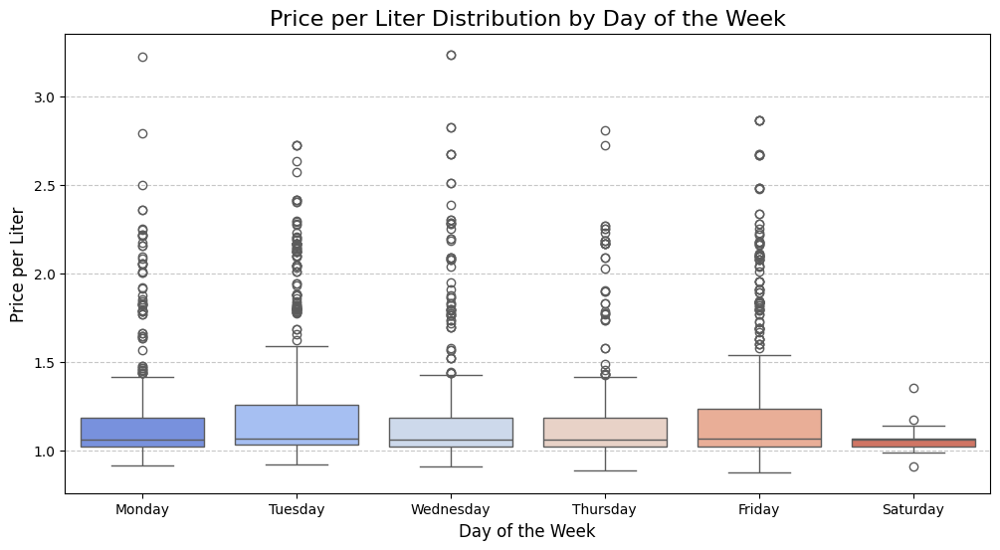

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure that the date column is converted
df_Invoices_clean_copy = df_Invoices_clean.copy()
df_Invoices_clean_copy['Invoice Date'] = pd.to_datetime(df_Invoices_clean_copy['Invoice Date'], errors='coerce')

# Add invoice date name column
df_Invoices_clean_copy['Invoice Day Name'] = df_Invoices_clean_copy['Invoice Date'].dt.day_name()


# 1. Calculation of unit price per purchase ($/liter)
df_Invoices_clean_copy['Price_per_Liter'] = df_Invoices_clean_copy['Gross Purchase Cost'] / df_Invoices_clean_copy['Amount Purchased']

# 2. View price distribution by day of week grouping
price_stats_by_day = df_Invoices_clean_copy.groupby('Invoice Day Name')['Price_per_Liter'].agg(['mean', 'median', 'min', 'max', 'std']).reset_index()
display(price_stats_by_day)

# Visualization of price distribution (box plots, etc.)
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_Invoices_clean_copy, x='Invoice Day Name', y='Price_per_Liter', palette='coolwarm', hue='Invoice Day Name', dodge=False, legend=False)
plt.title('Price per Liter Distribution by Day of the Week', fontsize=16)
plt.xlabel('Day of the Week', fontsize=12)
plt.ylabel('Price per Liter', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


### Identify the day with the lowest historical rates.

In [26]:
lowest_day = price_stats_by_day.loc[price_stats_by_day['mean'].idxmin(), 'Invoice Day Name']
lowest_day_price = price_stats_by_day.loc[price_stats_by_day['mean'].idxmin(), 'mean']
print(f"The day of the week with the lowest unit price in history is: {lowest_day}. The average price is about: {lowest_day_price:.4f} $/Liter")


The day of the week with the lowest unit price in history is: Saturday. The average price is about: 1.0721 $/Liter


### Calculate additional savings if purchases were consistently made on the identified day.

In [27]:
total_original_cost = df_Invoices_clean['Gross Purchase Cost'].sum()
total_amount = df_Invoices_clean['Amount Purchased'].sum()
hypothetical_cost = total_amount * lowest_day_price
additional_savings = total_original_cost - hypothetical_cost

print(f"If all future purchases are made on {lowest_day} (and the historical average price for that day is held constant), the additional savings would be approximately: ${additional_savings:,.2f}")


If all future purchases are made on Saturday (and the historical average price for that day is held constant), the additional savings would be approximately: $2,125,200.17


## Question 4: Evaluate the Feasibility of Adding Tanks 
Assess whether increasing tank capacity at certain locations would be beneficial.

### Assume the cost of adding a new tank and the average inflation rate. 

In [28]:
# Assumptions
cost_per_tank = 50000
inflation_rate = 0.03
years = 5

# Projected cost after 5 years
future_cost = cost_per_tank * ((1 + inflation_rate) ** years)
print(f"Projected cost of adding a new tank after 5 years: ${future_cost:.2f}")


Projected cost of adding a new tank after 5 years: $57963.70


### Estimate the cost-benefit of increased capacity over a 5-year period.

In [29]:
# Aggregate sales data by location
df_sales = df_Invoices_clean.groupby("Invoice Gas Station Location").agg(total_revenue=("Gross Purchase Cost", "sum"), total_amount=("Amount Purchased", "sum")).reset_index()

# Estimate additional capacity and revenue
additional_capacity = 10000  # Assumed additional tank capacity in liters
price_per_liter = df_sales["total_revenue"] / df_sales["total_amount"]  # Average price per liter
estimated_additional_revenue = additional_capacity * price_per_liter.mean() * 365 * years

# Calculate cost-benefit
net_benefit = estimated_additional_revenue - future_cost
print(f"Estimated additional revenue over 5 years on average: ${estimated_additional_revenue:.2f}")
print(f"Net benefit of adding a new tank on average: ${net_benefit:.2f}")


Estimated additional revenue over 5 years on average: $20600715.36
Net benefit of adding a new tank on average: $20542751.66


### Identify locations that would benefit most from additional tanks. 

In [30]:
# Parameters for analysis
additional_tank_capacity = 10000
cost_per_tank = 50000
inflation_rate = 0.03
years = 5

df_combined = df_sales.merge(df_Tanks, left_on="Invoice Gas Station Location", right_on="Tank Location")
df_combined["utilization_rate"] = df_combined["total_revenue"] / df_combined["total_amount"]
df_combined["additional_revenue"] = (df_combined["utilization_rate"] * additional_tank_capacity * 365 * years)
df_combined["net_benefit"] = df_combined["additional_revenue"] - future_cost

beneficial_locations = df_combined[df_combined["net_benefit"] > 0]

beneficial_locations = beneficial_locations[["Tank Location", "utilization_rate", "additional_revenue", "net_benefit"]].groupby('Tank Location').agg({
    'utilization_rate': 'mean',  # Average utilization rate
    'additional_revenue': 'mean',  # Mean additional revenue
    'net_benefit': 'mean'  # Mean net benefit
}).reset_index().sort_values(by="net_benefit", ascending=False)
display(beneficial_locations)

most_beneficial_location = beneficial_locations.loc[beneficial_locations['net_benefit'].idxmax()]
print(f"The location that benefits most from additional tanks is Location {most_beneficial_location['Tank Location']:.0f} with a net benefit of ${most_beneficial_location['net_benefit']:.2f}.")


,Tank Location,utilization_rate,additional_revenue,net_benefit
0,1,1.156321,2.110286e+07,2.104489e+07
3,4,1.151739,2.101924e+07,2.096128e+07
4,5,1.150072,2.098882e+07,2.093085e+07
7,8,1.127873,2.058369e+07,2.052572e+07
1,2,1.122885,2.049265e+07,2.043469e+07
6,7,1.121460,2.046665e+07,2.040868e+07
5,6,1.100755,2.008877e+07,2.003081e+07
2,3,1.099345,2.006305e+07,2.000509e+07


The location that benefits most from additional tanks is Location 1 with a net benefit of $21044893.53.


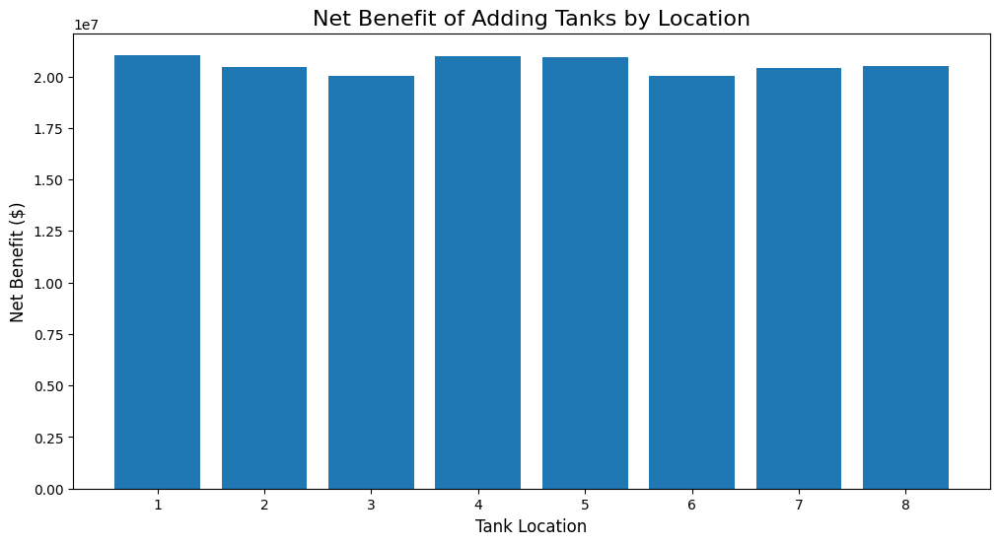

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.bar(beneficial_locations["Tank Location"], beneficial_locations["net_benefit"])
plt.title("Net Benefit of Adding Tanks by Location", fontsize=16)
plt.xlabel("Tank Location", fontsize=12)
plt.ylabel("Net Benefit ($)", fontsize=12)
plt.show()
